In [ ]:
!pip install -q roboflow torch torchvision albumentations segmentation-models-pytorch opencv-python
!pip install -q git+https://github.com/jacobgil/pytorch-grad-cam.git
!pip install -q scipy scikit-image scikit-learn seaborn
!pip install -q torchsummary torchviz

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.8/89.8 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 19.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 64.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 84.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="A5CNPickAXMW6oAxsBR4")
project = rf.workspace("mitosisdetection").project("ms-mitosis-detection2")
version = project.version(1)
dataset = version.download("coco")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to ms-mitosis-detection2-1 in coco:: 100%|██████████| 43424/43424 [00:09<00:00, 4548.05it/s]


In [ ]:
# Directory Structure

import os

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.gif', '.bmp', '.tiff', '.webp'}

def is_image_file(filename):
    return os.path.splitext(filename)[1].lower() in IMAGE_EXTENSIONS

def list_directory(path, indent=0):
    try:
        items = sorted(os.listdir(path))
    except PermissionError:
        print('  ' * indent + '📁 [Permission Denied]')
        return

    image_count = 0
    image_limit_hit = False

    for item in items:
        full_path = os.path.join(path, item)
        is_dir = os.path.isdir(full_path)
        is_image = is_image_file(item)

        if is_image:
            if image_count < 5:
                print('  ' * indent + f'🖼️ {item}')
            image_count += 1
            if image_count == 6 and not image_limit_hit:
                print('  ' * indent + '...')
                image_limit_hit = True
            continue

        if is_dir:
            print('  ' * indent + f'📁 {item}/')
            list_directory(full_path, indent + 1)
        elif not is_image:
            print('  ' * indent + f'📄 {item}')

datasets_folder = "/content/ms-mitosis-detection2-1"

if os.path.exists(datasets_folder):
    print(f"Mapping contents of '{datasets_folder}'...\n")
    list_directory(datasets_folder)
else:
    print(f"The folder '{datasets_folder}' does not exist.")


Mapping contents of '/content/ms-mitosis-detection2-1'...

📄 README.dataset.txt
📄 README.roboflow.txt
📁 test/
  🖼️ A03_00Cd_jpg.rf.036306ebdd438300f4ca70d5c4079acd.jpg
  🖼️ A03_00Cd_jpg.rf.055619019388459cce6b41d481a92e9d.jpg
  🖼️ A03_00Cd_jpg.rf.065188e9e2701c7b81b25b19838d6338.jpg
  🖼️ A03_00Cd_jpg.rf.08b4b388eeaffcd7ab23f0dbd8ccd08e.jpg
  🖼️ A03_00Cd_jpg.rf.0c0fc02e06ccfe6bac477f56e31b1c39.jpg
  ...
  📄 _annotations.coco.json
📁 train/
  🖼️ A03_00Aa_jpg.rf.0ff4ab35e122d74a42e7b74a77daeaf4.jpg
  🖼️ A03_00Aa_jpg.rf.16022bd276f99f388c25a2cda63c44ad.jpg
  🖼️ A03_00Aa_jpg.rf.182f8d3c12548fd43fd0efeb5130fbab.jpg
  🖼️ A03_00Aa_jpg.rf.23652e9d18fd413799472e8b06d7d1ad.jpg
  🖼️ A03_00Aa_jpg.rf.2685d315d4c605843481d4854afcea89.jpg
  ...
  📄 _annotations.coco.json
📁 valid/
  🖼️ A03_00Ad_jpg.rf.017b2453ab88d0ccd7cbc587cd244651.jpg
  🖼️ A03_00Ad_jpg.rf.050bd80cffd757c8195e741c51aa7e29.jpg
  🖼️ A03_00Ad_jpg.rf.092f8e73d25ae37928b99a9fa257fe63.jpg
  🖼️ A03_00Ad_jpg.rf.13566d061cc90a7cc247e1cc1d73587

## Data Loading

In [ ]:
# Total Images

base_path = '/content/ms-mitosis-detection2-1'
splits = ['train', 'valid', 'test']
image_extensions = {'.jpg', '.jpeg', '.png', '.bmp', '.tiff'}

for split in splits:
    folder_path = os.path.join(base_path, split)
    image_files = [f for f in os.listdir(folder_path)
                   if os.path.splitext(f)[1].lower() in image_extensions]
    print(f"{split.capitalize()} images: {len(image_files)}")

Train images: 26064
Valid images: 10908
Test images: 6444


In [ ]:
import json

f = open("/content/ms-mitosis-detection2-1/train/_annotations.coco.json")
data = json.load(f)

In [ ]:
data.keys()

dict_keys(['info', 'licenses', 'categories', 'images', 'annotations'])

In [ ]:
with open("annotations.json", "w") as f_out:
    json.dump(data, f_out)

In [ ]:
trimmed_data = {
    "info": data.get("info", {}),
    "licenses": data.get("licenses", []),
    "categories": data.get("categories", []),
    "images": data.get("images", [])[:5],
    "annotations": data.get("annotations", [])[:5]
}

print(json.dumps(trimmed_data, indent=2))

{
  "info": {
    "year": "2024",
    "version": "1",
    "description": "Exported from roboflow.com",
    "contributor": "",
    "url": "https://public.roboflow.com/object-detection/undefined",
    "date_created": "2024-01-19T18:58:21+00:00"
  },
  "licenses": [
    {
      "id": 1,
      "url": "https://creativecommons.org/licenses/by/4.0/",
      "name": "CC BY 4.0"
    }
  ],
  "categories": [
    {
      "id": 0,
      "name": "mitosis",
      "supercategory": "none"
    },
    {
      "id": 1,
      "name": "mitosis_0-0",
      "supercategory": "mitosis"
    },
    {
      "id": 2,
      "name": "mitosis_0-2",
      "supercategory": "mitosis"
    },
    {
      "id": 3,
      "name": "mitosis_0-65",
      "supercategory": "mitosis"
    },
    {
      "id": 4,
      "name": "mitosis_0-8",
      "supercategory": "mitosis"
    },
    {
      "id": 5,
      "name": "mitosis_1-0",
      "supercategory": "mitosis"
    }
  ],
  "images": [
    {
      "id": 0,
      "license": 1,
      

Image copied to: /content/A11_07Ab_jpg.rf.0c6cae7b029cbb1d5420125c9443538f.jpg


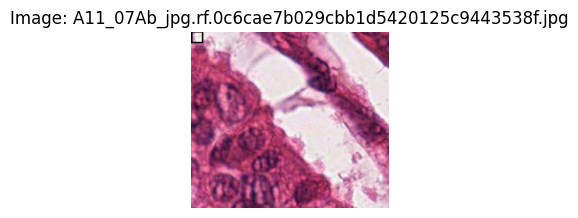

In [ ]:
import json
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
import shutil

annotations_file = '/content/ms-mitosis-detection2-1/train/_annotations.coco.json'
images_dir = '/content/ms-mitosis-detection2-1/train/'

# Load the annotations JSON
with open(annotations_file, 'r') as f:
    data = json.load(f)

# Load the annotations JSON
with open(annotations_file, 'r') as f:
    data = json.load(f)

# Find images that start with 'A17_01Ba'
matching_images = [img for img in data['images'] if img['file_name'].startswith('A11_07Ab')]

if not matching_images:
    print("No images found")
else:
    # Pick the first matching image as an example
    selected_image = matching_images[0]
    image_id = selected_image['id']
    file_name = selected_image['file_name']
    image_path = os.path.join(images_dir, file_name)

    # Check if the image file exists
    if not os.path.exists(image_path):
        print(f"Image file not found: {image_path}")
    else:
        # Copy the image to the current directory
        destination_path = os.path.join("/content", file_name)
        try:
            shutil.copy(image_path, destination_path)
            print(f"Image copied to: {destination_path}")
        except Exception as e:
            print(f"Error copying image: {e}")

        # Load the image
        img = Image.open(image_path)

        # Get annotations for this image
        annotations = [ann for ann in data['annotations'] if ann['image_id'] == image_id]

        # Draw bounding boxes if there are annotations
        draw = ImageDraw.Draw(img)
        for ann in annotations:
            bbox = ann['bbox']  # [x, y, width, height]
            category_id = ann['category_id']
            category_name = next(cat['name'] for cat in data['categories'] if cat['id'] == category_id)

            # Draw rectangle with black outline
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], outline='black', width=2)

            # Add label
            draw.text((bbox[0], bbox[1] - 10), category_name, fill='black')

        # Display the image using matplotlib with original size
        dpi = 100  # Standard DPI for display
        width, height = img.size
        plt.figure(figsize=(width/dpi, height/dpi), dpi=dpi)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Image: {file_name}")
        plt.show()

In [ ]:
from PIL import Image

img = Image.open("/content/A11_07Ab_jpg.rf.0c6cae7b029cbb1d5420125c9443538f.jpg")

width, height = img.size

print(f"Width: {width}, Height: {height}")


Width: 256, Height: 229


## Sample Visualization

In [ ]:
import os
import random
import json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import numpy as np

In [ ]:
dataset_path = '/content/ms-mitosis-detection2-1'
split = 'train'

In [ ]:
annotations_file = os.path.join(dataset_path, split, '_annotations.coco.json')
with open(annotations_file, 'r') as f:
    data = json.load(f)

In [ ]:
image_id_to_annotations = {}
for ann in data['annotations']:
    image_id_to_annotations.setdefault(ann['image_id'], []).append(ann)

In [ ]:
len(image_id_to_annotations)

10765

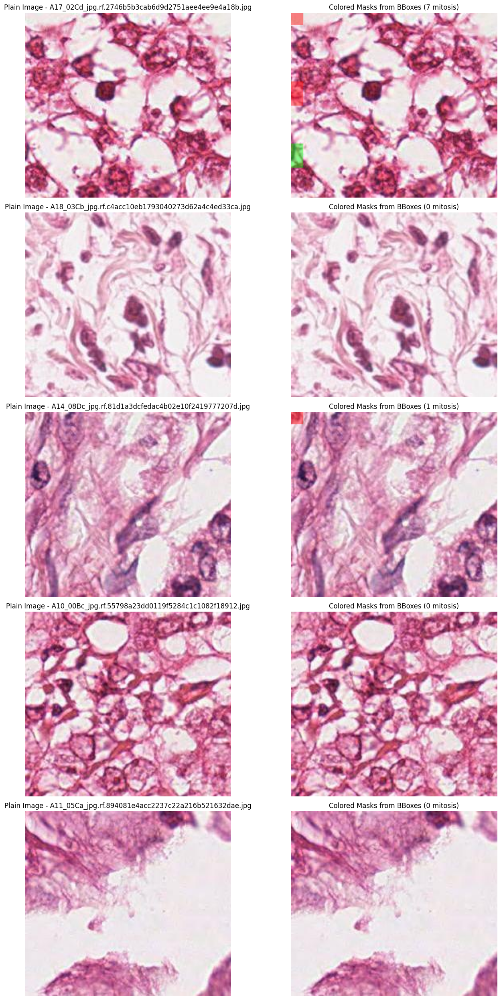

In [ ]:
random_images = random.sample(data['images'], 5)

PALETTE = np.array([
    [0, 0, 0],        # 0 (background - not used)
    [255, 0, 0],      # 1 red
    [0, 255, 0],      # 2 green
    [0, 0, 255],      # 3 blue
    [255, 255, 0],    # 4 yellow
    [255, 0, 255],    # 5 magenta
    [0, 255, 255],    # 6 cyan
], dtype=np.uint8)

def overlay_bbox_masks(image_np, anns, alpha=0.45, num_classes=None):
    """
    image_np: HxWx3 uint8 image (RGB)
    anns: list of COCO-style annotations with bbox [x,y,w,h] and category_id
    alpha: transparency for colored masks
    num_classes: optional upper bound for category ids; if None, inferred from PALETTE
    """
    H, W, _ = image_np.shape
    mask_rgb = np.zeros((H, W, 3), dtype=np.uint8)
    used = np.zeros((H, W), dtype=np.uint8)

    max_c = (num_classes if num_classes is not None else (PALETTE.shape[0]-1))

    for ann in anns:
        x, y, w, h = ann['bbox']
        # clamp to valid ints
        x0 = max(0, int(round(x)))
        y0 = max(0, int(round(y)))
        x1 = min(W, x0 + max(1, int(round(w))))
        y1 = min(H, y0 + max(1, int(round(h))))
        cid = int(ann.get('category_id', 1))

        # choose color: if cid exceeds palette, wrap around
        if cid > max_c:
            color = PALETTE[1 + (cid - 1) % (PALETTE.shape[0]-1)]
        else:
            color = PALETTE[cid] if cid < PALETTE.shape[0] else PALETTE[1]

        # fill bbox region with that color (as a mask)
        mask_rgb[y0:y1, x0:x1] = color
        used[y0:y1, x0:x1] = 1

    # alpha blend only where mask is present
    image_f = image_np.astype(np.float32) / 255.0
    mask_f  = mask_rgb.astype(np.float32) / 255.0
    used_3  = np.repeat(used[..., None], 3, axis=2).astype(np.float32)

    blended = image_f * (1 - used_3 * alpha) + mask_f * (used_3 * alpha)
    blended = (np.clip(blended, 0, 1) * 255).astype(np.uint8)
    return blended

# Your plotting loop, modified to show colored masks
fig, axs = plt.subplots(len(random_images), 2, figsize=(15, 5 * len(random_images)))

for i, img_info in enumerate(random_images):
    img_path = os.path.join(dataset_path, split, img_info['file_name'])
    image = Image.open(img_path).convert('RGB')
    image_np = np.array(image)

    anns = image_id_to_annotations.get(img_info['id'], [])

    # Left: plain image
    axs[i][0].imshow(image_np)
    axs[i][0].set_title(f'Plain Image - {img_info["file_name"]}')
    axs[i][0].axis('off')

    # Right: colored mask overlay
    overlay = overlay_bbox_masks(image_np, anns, alpha=0.45)
    axs[i][1].imshow(overlay)
    axs[i][1].set_title(f'Colored Masks from BBoxes ({len(anns)} mitosis)')
    axs[i][1].axis('off')

plt.tight_layout()
plt.show()

## **Imports**

In [ ]:
import os
import json
import cv2
import numpy as np
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau
import torch.backends.cudnn as cudnn

import albumentations as A
from albumentations.pytorch import ToTensorV2
import torchvision.transforms as T
from torchvision.models import resnet50

import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
from tqdm.notebook import tqdm
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from scipy.spatial.distance import directed_hausdorff
import skimage.filters as filters

# Grad-CAM imports
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

## **Dataset and Data Loader**

In [ ]:
import os
import json
import cv2
import numpy as np
import random
from torch.utils.data import Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2

In [ ]:
IMG_SIZE = 256
NUM_CLASSES = 6  # 0 = background, 1-5 = mitosis categories

In [ ]:
class MitosisSegmentationDataset(Dataset):
    def __init__(self, root_dir, split='train', transforms=None,
                 max_images=2000, random_seed=42, verbose=True,
                 pos_ratio=0.90):
        """
        pos_ratio: fraction of images that must have ≥1 annotation (e.g., 0.90).
                   Remaining (1 - pos_ratio) will be images with zero annotations.
        verbose: print a detailed report about filtering, counts, and any issues.
        """
        assert 0.0 < pos_ratio < 1.0, "pos_ratio must be in (0,1)"
        self.root_dir = root_dir
        self.split_dir = os.path.join(root_dir, split)
        self.transforms = transforms
        self.split = split
        self.pos_ratio = pos_ratio
        rng = random.Random(random_seed)

        ann_path = os.path.join(self.split_dir, "_annotations.coco.json")
        with open(ann_path, 'r') as f:
            coco = json.load(f)
        self.coco = coco

        # Map image_id -> filename
        id_to_filename = {img["id"]: img["file_name"] for img in coco["images"]}

        # Build full annotation index first (before sampling)
        anns_by_image = {img_id: [] for img_id in id_to_filename.keys()}
        invalid_cat = set()
        unknown_img_ids = set()
        for ann in coco["annotations"]:
            img_id = ann.get("image_id")
            cat_id = ann.get("category_id")
            if img_id not in anns_by_image:
                unknown_img_ids.add(img_id)
                continue
            if not (0 <= cat_id < NUM_CLASSES):
                invalid_cat.add(cat_id)
                continue
            anns_by_image[img_id].append(ann)

        # Separate positives (≥1 ann) and negatives (0 ann)
        all_image_ids = list(id_to_filename.keys())
        positive_ids = [i for i in all_image_ids if len(anns_by_image[i]) > 0]
        negative_ids = [i for i in all_image_ids if len(anns_by_image[i]) == 0]

        # Ensure files exist; drop missing files
        def has_file(img_id):
            fn = id_to_filename.get(img_id)
            return fn is not None and os.path.isfile(os.path.join(self.split_dir, fn))

        positive_ids = [i for i in positive_ids if has_file(i)]
        negative_ids = [i for i in negative_ids if has_file(i)]

        # Determine target sample counts
        total_available = len(positive_ids) + len(negative_ids)
        if max_images is None or max_images > total_available:
            max_images = total_available

        target_pos = int(round(max_images * pos_ratio))
        target_neg = max_images - target_pos

        # Sample without replacement (clip by availability)
        target_pos = min(target_pos, len(positive_ids))
        target_neg = min(target_neg, len(negative_ids))
        # If one side is short, fill remainder from the other side
        if target_pos + target_neg < max_images:
            remainder = max_images - (target_pos + target_neg)
            rem_pos = len(positive_ids) - target_pos
            take_pos = min(remainder, rem_pos)
            target_pos += take_pos
            remainder -= take_pos
            if remainder > 0:
                rem_neg = len(negative_ids) - target_neg
                take_neg = min(remainder, rem_neg)
                target_neg += take_neg

        sampled_pos = rng.sample(positive_ids, target_pos) if target_pos > 0 else []
        sampled_neg = rng.sample(negative_ids, target_neg) if target_neg > 0 else []
        sampled_ids = set(sampled_pos + sampled_neg)

        # Final per-image annotations restricted to sampled ids
        self.annotations = {img_id: anns_by_image[img_id] for img_id in sampled_ids}
        self.id_to_filename = {img_id: id_to_filename[img_id] for img_id in sampled_ids}
        self.image_ids = list(sampled_ids)

        # Helper: compute images-per-class counts (how many images contain ≥1 instance of each class id)
        def images_per_class(image_ids, anns_index, num_classes):
            counts = np.zeros(num_classes, dtype=np.int64)
            for img_id in image_ids:
                anns = anns_index.get(img_id, [])
                present = set()
                for a in anns:
                    cid = int(a.get("category_id", -1))
                    if 0 <= cid < num_classes:
                        present.add(cid)
                for cid in present:
                    counts[cid] += 1
            return counts

        if verbose:
            # Available pool stats (after file check)
            available_ids = positive_ids + negative_ids
            avail_counts = images_per_class(available_ids, anns_by_image, NUM_CLASSES)
            sampled_counts = images_per_class(self.image_ids, self.annotations, NUM_CLASSES)

            missing_files = [id_to_filename[i] for i in all_image_ids if not has_file(i)]
            pos_avail, neg_avail = len(positive_ids), len(negative_ids)

            print(f"[{split}] total images in JSON: {len(all_image_ids)}")
            print(f"[{split}] available on disk: {pos_avail + neg_avail} (positives: {pos_avail}, negatives: {neg_avail})")
            print(f"[{split}] requested max_images={max_images}, pos_ratio={pos_ratio:.2f}")
            print()
            print(f"[{split}] sampled: {len(self.image_ids)} (positives: {len(sampled_pos)}, negatives: {len(sampled_neg)})")
            if invalid_cat:
                print(f"[{split}] WARN invalid category_id(s) outside 0..{NUM_CLASSES-1}: {sorted(list(invalid_cat))}")
            if unknown_img_ids:
                some = sorted(list(unknown_img_ids))[:5]
                print(f"[{split}] WARN annotations referencing unknown image_id(s): count={len(unknown_img_ids)}, sample={some}")
            if missing_files:
                print(f"[{split}] WARN missing image files on disk: {len(missing_files)} (first 5): {missing_files[:5]}")

            zeros = [i for i in self.image_ids if len(self.annotations[i]) == 0]
            nonzeros = len(self.image_ids) - len(zeros)
            print(f"[{split}] sampled composition -> with anns: {nonzeros}, without anns: {len(zeros)}")

            # Labels: use COCO names if present and aligned to ids; fall back gracefully
            cat_names = {}
            for c in range(NUM_CLASSES):
                try:
                    cat_names[c] = self.coco.get('categories', [])[c].get('name', f"class_{c}")
                except Exception:
                    cat_names[c] = f"class_{c}"

            # Background is class 0: report it only as "background-only images", and exclude 0 from per-class list
            def fmt_counts(ids, counts, src_index, title):
                bg_only = len([i for i in ids if len(src_index.get(i, [])) == 0])
                lines = [title, f"  background-only images (no anns): {bg_only}"]
                for c in range(1, NUM_CLASSES):  # exclude background (class 0)
                    lines.append(f"  {c:>2} ({cat_names.get(c, f'class_{c}')}) : {counts[c]}")
                return "\n".join(lines)

            print(f"[{split}] images-per-class (available):")
            print(fmt_counts(available_ids, avail_counts, anns_by_image, "  counts by class (excluding background class 0):"))
            print(f"[{split}] images-per-class (sampled):")
            print(fmt_counts(self.image_ids, sampled_counts, self.annotations, "  counts by class (excluding background class 0):"))

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        file_name = self.id_to_filename[image_id]
        img_path = os.path.join(self.split_dir, file_name)

        image = cv2.imread(img_path)
        if image is None:
            raise RuntimeError(f"Failed to read image: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        H, W, _ = image.shape
        mask = np.zeros((H, W), dtype=np.uint8)
        # Fill mask for positives; negatives stay all-zero (background class 0)
        for ann in self.annotations.get(image_id, []):
            x, y, w, h = ann["bbox"]
            x0 = max(0, int(round(x)))
            y0 = max(0, int(round(y)))
            x1 = min(W, x0 + max(1, int(round(w))))
            y1 = min(H, y0 + max(1, int(round(h))))
            cid = int(ann["category_id"])
            if 0 <= cid < NUM_CLASSES:
                mask[y0:y1, x0:x1] = cid

        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"].long()
        else:
            image = ToTensorV2()(image=image)["image"]
            mask = torch.as_tensor(mask, dtype=torch.long)

        return image, mask


In [ ]:
def get_train_transforms():
    # No augmentations; identical to validation
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])

def get_val_transforms():
    return A.Compose([
        A.PadIfNeeded(min_height=IMG_SIZE, min_width=IMG_SIZE, border_mode=cv2.BORDER_CONSTANT),
        A.CenterCrop(width=IMG_SIZE, height=IMG_SIZE),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])

In [ ]:
from torch.utils.data import DataLoader

root_dir = '/content/ms-mitosis-detection2-1'
train_dataset = MitosisSegmentationDataset(root_dir, split='train', max_images=1100, pos_ratio=0.99, transforms=get_train_transforms())
print()
val_dataset   = MitosisSegmentationDataset(root_dir, split='valid', max_images=1500, transforms=get_val_transforms())
print()
test_dataset  = MitosisSegmentationDataset(root_dir, split='test',  max_images=750 ,transforms=get_val_transforms())

[train] total images in JSON: 26064
[train] available on disk: 26064 (positives: 10765, negatives: 15299)
[train] requested max_images=1100, pos_ratio=0.99

[train] sampled: 1100 (positives: 1089, negatives: 11)
[train] sampled composition -> with anns: 1089, without anns: 11
[train] images-per-class (available):
  counts by class (excluding background class 0):
  background-only images (no anns): 15299
   1 (mitosis_0-0) : 8097
   2 (mitosis_0-2) : 1460
   3 (mitosis_0-65) : 1520
   4 (mitosis_0-8) : 969
   5 (mitosis_1-0) : 1900
[train] images-per-class (sampled):
  counts by class (excluding background class 0):
  background-only images (no anns): 11
   1 (mitosis_0-0) : 818
   2 (mitosis_0-2) : 155
   3 (mitosis_0-65) : 155
   4 (mitosis_0-8) : 87
   5 (mitosis_1-0) : 207

[valid] total images in JSON: 10908
[valid] available on disk: 10908 (positives: 4317, negatives: 6591)
[valid] requested max_images=1500, pos_ratio=0.90

[valid] sampled: 1500 (positives: 1350, negatives: 150)
[

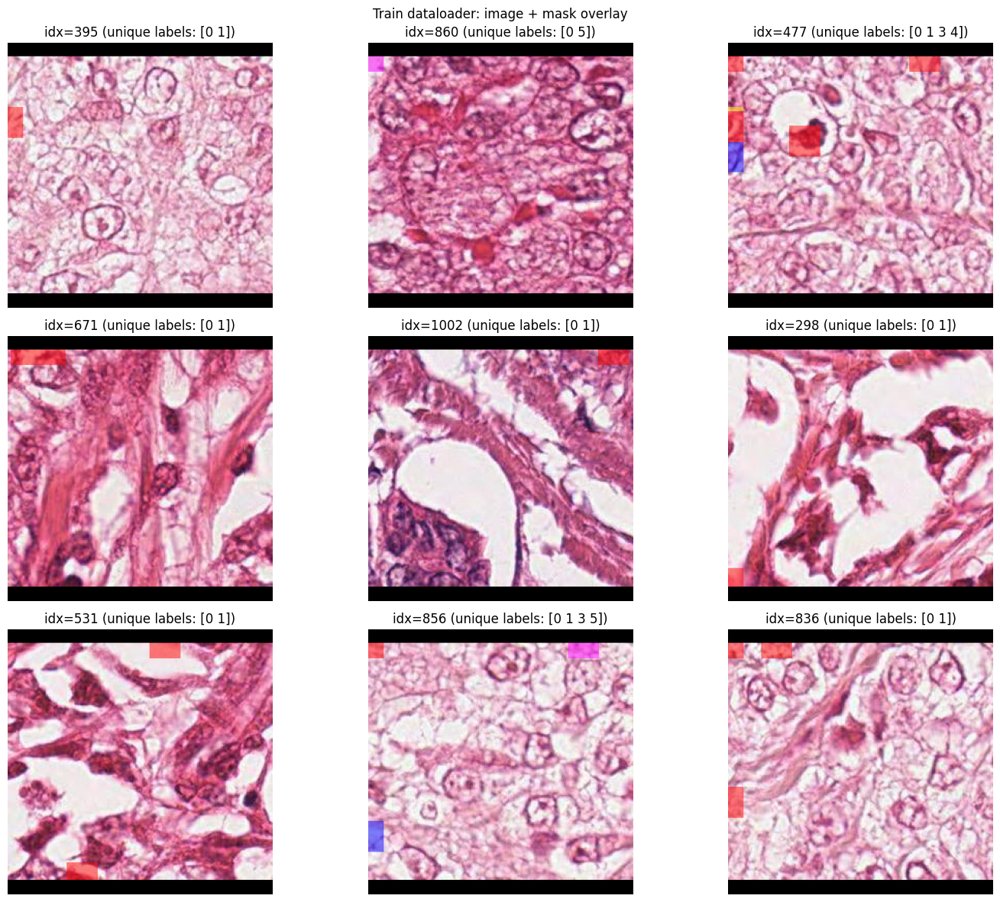

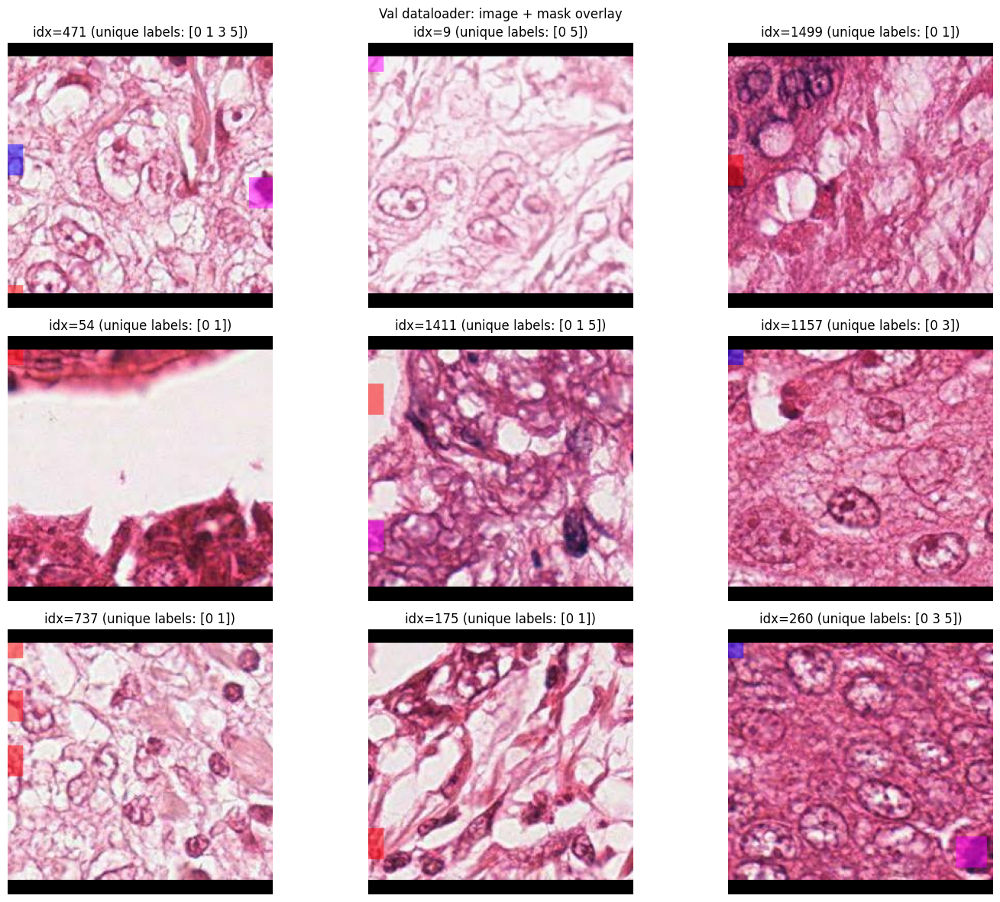

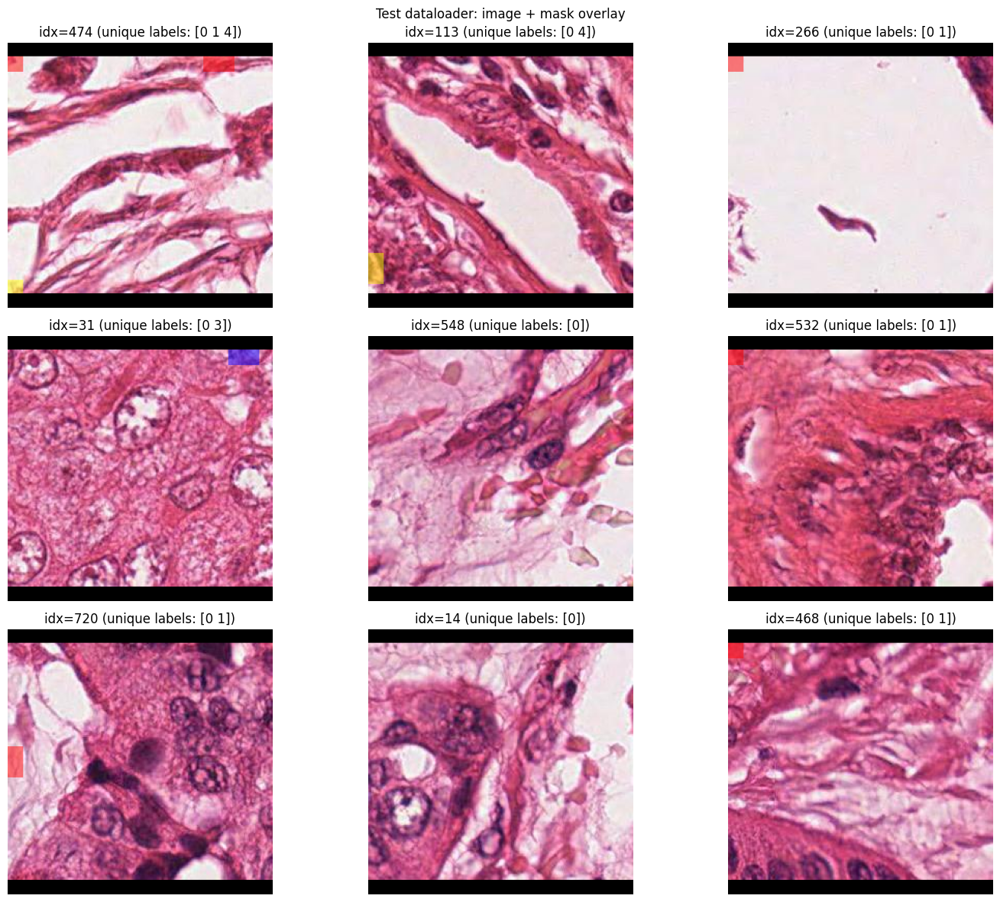

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch


# Reuse your overlay_mask but ensure colors are consistent
def overlay_mask(image_np01, mask_hw, alpha=0.5):
    colors = np.array([
        [0, 0, 0],     # 0 background
        [1, 0, 0],     # 1 red
        [0, 1, 0],     # 2 green
        [0, 0, 1],     # 3 blue
        [1, 1, 0],     # 4 yellow
        [1, 0, 1],     # 5 magenta
    ], dtype=np.float32)

    mask_rgb = np.zeros((*mask_hw.shape, 3), dtype=np.float32)
    for cid in range(1, min(NUM_CLASSES, colors.shape[0])):  # skip background
        mask_rgb[mask_hw == cid] = colors[cid]

    is_mask = (mask_hw > 0).astype(np.float32)[..., None]
    blended = image_np01 * (1 - is_mask * alpha) + mask_rgb * alpha
    return np.clip(blended, 0, 1)

def unnormalize(img_tensor):
    # img: CxHxW, normalized with mean=0.5, std=0.5
    img = img_tensor.permute(1,2,0).cpu().numpy()
    img = img * 0.5 + 0.5
    return np.clip(img, 0, 1)

def visualize_dataset_overlays(dataset, num_samples=6, seed=0, title="Dataset overlays"):
    np.random.seed(seed)
    idxs = np.random.choice(len(dataset), size=min(num_samples, len(dataset)), replace=False)
    n = len(idxs)
    cols = 3
    rows = (n + cols - 1) // cols
    plt.figure(figsize=(5*cols, 4*rows))
    for i, idx in enumerate(idxs):
        img_t, mask_t = dataset[idx]
        img_np = unnormalize(img_t)
        mask_np = mask_t.cpu().numpy()
        overlay = overlay_mask(img_np, mask_np, alpha=0.5)
        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(overlay)
        ax.set_title(f"idx={idx} (unique labels: {np.unique(mask_np)})")
        ax.axis('off')
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Example usage:
visualize_dataset_overlays(train_dataset, num_samples=9, title="Train dataloader: image + mask overlay")
visualize_dataset_overlays(val_dataset,   num_samples=9, title="Val dataloader: image + mask overlay")
visualize_dataset_overlays(test_dataset,  num_samples=9, title="Test dataloader: image + mask overlay")


## **MODEL ARCHITECTURE**

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [ ]:
class SEBlock(nn.Module):
    """Squeeze and Excitation Block - Lightweight Attention Mechanism"""
    def __init__(self, channels, r=16):
        super().__init__()
        self.avg = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels//r, bias=False),
            nn.LeakyReLU(0.01, inplace=True),  # Paper specifies LeakyReLU
            nn.Linear(channels//r, channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        w = self.avg(x).view(b, c)  # Adaptive average pooling
        w = self.fc(w).view(b, c, 1, 1)
        return x * w  # Element-wise multiplication

In [ ]:
class DALAResNet50(nn.Module):
    """Dual-Activated Lightweight Attention ResNet50"""
    def __init__(self, n_classes=NUM_CLASSES):
        super().__init__()

        self.base = resnet50(weights='IMAGENET1K_V1')

        self.base.layer3 = nn.Sequential(
            *list(self.base.layer3),
            SEBlock(1024, r=16)
        )

        self.base.fc = nn.Sequential(
            nn.Linear(2048, 1024),
            nn.LeakyReLU(0.01, inplace=True),  # First activation: LeakyReLU
            nn.Dropout(0.25),  # 0.25 dropout
            nn.Linear(1024, n_classes),
            nn.ReLU(inplace=True)  # Second activation: ReLU
        )

    def forward(self, x):
        return self.base(x)


In [ ]:
# For segmentation task, we need a different approach
class DALAResNet50Segmentation(nn.Module):
    """DALAResNet50 adapted for segmentation"""
    def __init__(self, n_classes=NUM_CLASSES):
        super().__init__()
        # Use ResNet50 as encoder
        resnet = resnet50(weights='IMAGENET1K_V1')

        # Encoder layers
        self.conv1 = resnet.conv1
        self.bn1 = resnet.bn1
        self.relu = resnet.relu
        self.maxpool = resnet.maxpool

        self.layer1 = resnet.layer1  # 256 channels
        self.layer2 = resnet.layer2  # 512 channels
        self.layer3 = nn.Sequential(
            *list(resnet.layer3),
            SEBlock(1024, r=16)  # Add attention after layer3
        )
        self.layer4 = resnet.layer4  # 2048 channels

        # Decoder with dual activation
        self.decoder4 = self._make_decoder_block(2048, 1024)
        self.decoder3 = self._make_decoder_block(1024, 512)
        self.decoder2 = self._make_decoder_block(512, 256)
        self.decoder1 = self._make_decoder_block(256, 128)

        self.final_conv = nn.Conv2d(128, n_classes, kernel_size=1)

    def _make_decoder_block(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels,
                             kernel_size=2, stride=2),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.01, inplace=True),  # Dual activation
            nn.Conv2d(out_channels, out_channels,
                     kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)  # Second activation
        )

    def forward(self, x):
        # Encoder
        x1 = self.relu(self.bn1(self.conv1(x)))
        x1_pool = self.maxpool(x1)

        x2 = self.layer1(x1_pool)
        x3 = self.layer2(x2)
        x4 = self.layer3(x3)
        x5 = self.layer4(x4)

        # Decoder
        d4 = self.decoder4(x5)
        d3 = self.decoder3(d4 + x4)  # Skip connection
        d2 = self.decoder2(d3 + x3)  # Skip connection
        d1 = self.decoder1(d2 + x2)  # Skip connection

        out = self.final_conv(d1)
        return F.interpolate(out, size=(IMG_SIZE, IMG_SIZE),
                           mode='bilinear', align_corners=False)

In [ ]:
def get_train_transforms():
    """Training transforms as per paper specifications"""
    return A.Compose([
        A.Resize(IMG_SIZE, IMG_SIZE),  # 224x224 as per paper
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),  # [-1,1] normalization
        ToTensorV2()
    ])

def get_val_transforms():
    """Validation transforms"""
    return A.Compose([
        A.Resize(IMG_SIZE, IMG_SIZE),
        A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
        ToTensorV2()
    ])

In [ ]:
class MitosisSegmentationDataset(Dataset):
    def __init__(self, root_dir, split='train', transforms=None,
                 max_images=2000, random_seed=42, verbose=True,
                 pos_ratio=0.90):
        """
        Updated dataset class with proper error handling
        """
        assert 0.0 < pos_ratio < 1.0, "pos_ratio must be in (0,1)"

        self.root_dir = root_dir
        self.split_dir = os.path.join(root_dir, split)
        self.transforms = transforms
        self.split = split
        self.pos_ratio = pos_ratio

        rng = random.Random(random_seed)

        # Load annotations
        ann_path = os.path.join(self.split_dir, "_annotations.coco.json")
        if not os.path.exists(ann_path):
            raise FileNotFoundError(f"Annotations not found: {ann_path}")

        with open(ann_path, 'r') as f:
            coco = json.load(f)

        self.coco = coco

        # Process annotations (your existing code logic)
        id_to_filename = {img["id"]: img["file_name"] for img in coco["images"]}
        anns_by_image = {img_id: [] for img_id in id_to_filename.keys()}

        for ann in coco["annotations"]:
            img_id = ann.get("image_id")
            cat_id = ann.get("category_id")
            if img_id in anns_by_image and 0 <= cat_id < NUM_CLASSES:
                anns_by_image[img_id].append(ann)

        # Filter and sample (your existing logic)
        all_image_ids = list(id_to_filename.keys())
        positive_ids = [i for i in all_image_ids if len(anns_by_image[i]) > 0]
        negative_ids = [i for i in all_image_ids if len(anns_by_image[i]) == 0]

        # Check file existence
        def has_file(img_id):
            fn = id_to_filename.get(img_id)
            return fn and os.path.isfile(os.path.join(self.split_dir, fn))

        positive_ids = [i for i in positive_ids if has_file(i)]
        negative_ids = [i for i in negative_ids if has_file(i)]

        # Sample according to pos_ratio
        total_available = len(positive_ids) + len(negative_ids)
        if max_images > total_available:
            max_images = total_available

        target_pos = min(int(max_images * pos_ratio), len(positive_ids))
        target_neg = min(max_images - target_pos, len(negative_ids))

        sampled_pos = rng.sample(positive_ids, target_pos) if target_pos > 0 else []
        sampled_neg = rng.sample(negative_ids, target_neg) if target_neg > 0 else []
        sampled_ids = sampled_pos + sampled_neg

        # Final setup
        self.annotations = {img_id: anns_by_image[img_id] for img_id in sampled_ids}
        self.id_to_filename = {img_id: id_to_filename[img_id] for img_id in sampled_ids}
        self.image_ids = list(sampled_ids)

        if verbose:
            print(f"[{split}] Loaded {len(self.image_ids)} images")
            print(f"[{split}] Positives: {len(sampled_pos)}, Negatives: {len(sampled_neg)}")

    def __len__(self):
        return len(self.image_ids)

    def __getitem__(self, idx):
        image_id = self.image_ids[idx]
        file_name = self.id_to_filename[image_id]
        img_path = os.path.join(self.split_dir, file_name)

        # Load image
        image = cv2.imread(img_path)
        if image is None:
            raise RuntimeError(f"Failed to read image: {img_path}")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        H, W, _ = image.shape
        mask = np.zeros((H, W), dtype=np.uint8)

        # Create mask from bounding boxes
        for ann in self.annotations.get(image_id, []):
            x, y, w, h = ann["bbox"]
            x0, y0 = max(0, int(x)), max(0, int(y))
            x1, y1 = min(W, x0 + max(1, int(w))), min(H, y0 + max(1, int(h)))

            cid = int(ann["category_id"])
            if 0 <= cid < NUM_CLASSES:
                mask[y0:y1, x0:x1] = cid

        # Apply transforms
        if self.transforms:
            augmented = self.transforms(image=image, mask=mask)
            image = augmented["image"]
            mask = augmented["mask"].long()
        else:
            image = torch.tensor(image.transpose(2, 0, 1), dtype=torch.float32) / 255.0
            mask = torch.tensor(mask, dtype=torch.long)

        return image, mask

## **Loss Function: DICE + Categorical loss**

In [ ]:
import torch
import torch.nn.functional as F
from torch.utils.data import DataLoader
from tqdm import tqdm
import numpy as np
from scipy.spatial.distance import directed_hausdorff

In [ ]:
def dice_loss(pred, target, num_classes, epsilon=1e-6):
    """Multi-class Dice loss"""
    pred_soft = F.softmax(pred, dim=1)
    target_one_hot = F.one_hot(target, num_classes).permute(0, 3, 1, 2).float()

    dims = (0, 2, 3)
    intersection = torch.sum(pred_soft * target_one_hot, dims)
    cardinality = torch.sum(pred_soft + target_one_hot, dims)

    dice = (2. * intersection + epsilon) / (cardinality + epsilon)
    return 1. - dice.mean()

class ComboLoss(nn.Module):
    """Combined Cross Entropy + Dice Loss"""
    def __init__(self, weight_dice=0.5, class_weights=None):
        super().__init__()
        self.ce = nn.CrossEntropyLoss(weight=class_weights)
        self.weight_dice = weight_dice

    def forward(self, pred, target):
        ce_loss = self.ce(pred, target)
        dice = dice_loss(pred, target, NUM_CLASSES)
        return (1 - self.weight_dice) * ce_loss + self.weight_dice * dice

In [ ]:
def compute_dice_score(pred, target, num_classes, epsilon=1e-6):
    """Compute per-class Dice scores"""
    dice_per_class = []
    for cls in range(num_classes):
        # Ensure inputs are treated as boolean masks for comparison
        pred_cls = (pred == cls).astype(np.float32) # Use numpy operations
        target_cls = (target == cls).astype(np.float32)

        intersection = (pred_cls * target_cls).sum()
        union = pred_cls.sum() + target_cls.sum()

        # Handle cases where a class might not be present in prediction or target
        if union == 0:
            dice = 1.0 if intersection == 0 else 0.0 # If both empty, perfect score. Otherwise, 0.
        else:
            dice = (2. * intersection + epsilon) / (union + epsilon)

        dice_per_class.append(dice)
    return dice_per_class

def compute_iou(pred, target, num_classes, epsilon=1e-6):
    """Compute per-class IoU scores"""
    iou_per_class = []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(np.float32)
        target_cls = (target == cls).astype(np.float32)

        intersection = (pred_cls * target_cls).sum()
        union = pred_cls.sum() + target_cls.sum() - intersection

        if union == 0:
            iou = 1.0 if intersection == 0 else 0.0 # If both empty, perfect score. Otherwise, 0.
        else:
             iou = (intersection + epsilon) / (union + epsilon)

        iou_per_class.append(iou)
    return iou_per_class

def compute_precision_recall(pred, target, num_classes, epsilon=1e-6):
    """Compute per-class precision and recall"""
    precision_per_class, recall_per_class = [], []
    for cls in range(num_classes):
        pred_cls = (pred == cls).astype(bool) # Explicitly cast to boolean
        target_cls = (target == cls).astype(bool) # Explicitly cast to boolean

        tp = np.sum(pred_cls & target_cls) # Use numpy sum
        fp = np.sum(pred_cls & ~target_cls)
        fn = np.sum(~pred_cls & target_cls)

        precision = (tp + epsilon) / (tp + fp + epsilon)
        recall = (tp + epsilon) / (tp + fn + epsilon)

        precision_per_class.append(precision)
        recall_per_class.append(recall)
    return precision_per_class, recall_per_class

def compute_hausdorff_distance(pred, target, class_id):
    """Compute Hausdorff distance for a specific class"""
    pred_points = np.argwhere(pred == class_id)
    target_points = np.argwhere(target == class_id)

    if pred_points.size == 0 or target_points.size == 0:
        return np.nan

    # Using scipy.spatial.distance.directed_hausdorff which expects numpy arrays
    hd1 = directed_hausdorff(pred_points, target_points)[0]
    hd2 = directed_hausdorff(target_points, pred_points)[0]
    return max(hd1, hd2)

def compute_cohen_kappa(pred, target, num_classes):
    pred = pred.flatten()
    target = target.flatten()
    combined = target * num_classes + pred
    confusion_flat = np.bincount(combined, minlength=num_classes**2)
    confusion = confusion_flat.reshape(num_classes, num_classes)
    total = confusion.sum()
    if total == 0:
        return 1.0
    po = np.trace(confusion) / total
    rowsums = confusion.sum(axis=1)
    colsums = confusion.sum(axis=0)
    pe = np.dot(rowsums, colsums) / (total ** 2)
    kappa = (po - pe) / (1 - pe + 1e-8)
    return kappa

In [ ]:
def _confusion_matrix_batch(preds: torch.Tensor, targets: torch.Tensor, num_classes: int, device=None):
    """
    Build confusion matrix for a batch.
    preds, targets: shape (B, H, W) integer long tensors (0..num_classes-1)
    Returns: confusion matrix shape (num_classes, num_classes) where
      row = target (true), col = pred (predicted)
    """
    if device is None:
        device = preds.device

    preds_flat = preds.view(-1).long()
    targets_flat = targets.view(-1).long()
    # combined index = target * num_classes + pred
    combined = targets_flat * num_classes + preds_flat
    # bincount length
    minlength = num_classes * num_classes
    # bincount on device
    counts = torch.bincount(combined, minlength=minlength).to(device)
    conf = counts.reshape(num_classes, num_classes)
    return conf

def metrics_from_confusion(confusion: torch.Tensor, eps: float):
    """
    Given confusion (num_classes x num_classes) torch tensor, compute:
      - per-class Dice
      - per-class IoU
      - per-class Precision
      - per-class Recall
      - Cohen's kappa (single scalar)
    Returns numpy arrays/double for easier downstream logging.
    """
    conf = confusion.float()
    total = conf.sum().item()
    if total == 0:
        # no pixels at all; return defaults
        num_classes = conf.shape[0]
        return {
            'dice': np.ones(num_classes),
            'iou': np.ones(num_classes),
            'precision': np.ones(num_classes),
            'recall': np.ones(num_classes),
            'kappa': 1.0
        }

    tp = conf.diag()                        # TP per class
    target_sum = conf.sum(dim=1)            # row sums (ground truth count per class)
    pred_sum = conf.sum(dim=0)              # col sums (predicted count per class)

    # Dice: 2*TP / (pred_sum + target_sum)
    denom_dice = pred_sum + target_sum
    dice = torch.where(denom_dice == 0, torch.ones_like(denom_dice),
                       (2.0 * tp + eps) / (denom_dice + eps))

    # IoU: TP/(pred + target - TP)
    denom_iou = pred_sum + target_sum - tp
    iou = torch.where(denom_iou == 0, torch.ones_like(denom_iou),
                      (tp + eps) / (denom_iou + eps))

    # Precision: TP / pred_sum
    precision = torch.where(pred_sum == 0, torch.ones_like(pred_sum),
                            (tp + eps) / (pred_sum + eps))

    # Recall: TP / target_sum
    recall = torch.where(target_sum == 0, torch.ones_like(target_sum),
                         (tp + eps) / (target_sum + eps))

    # Cohen's kappa
    po = tp.sum() / total
    rows = target_sum
    cols = pred_sum
    pe = (rows * cols).sum() / (total * total)
    kappa = (po - pe) / (1.0 - pe + eps)

    return {
        'dice': dice.cpu().numpy(),
        'iou': iou.cpu().numpy(),
        'precision': precision.cpu().numpy(),
        'recall': recall.cpu().numpy(),
        'kappa': float(kappa.cpu().item())
    }

def compute_hausdorff_on_pairs(pairs, class_id):
    """
    pairs: list of (pred_np, target_np) numpy arrays (H,W)
    compute Hausdorff for given class_id for each pair, return list of floats (np.nan for missing)
    """
    results = []
    for pred_np, target_np in pairs:
        pred_points = np.argwhere(pred_np == class_id)
        target_points = np.argwhere(target_np == class_id)
        if pred_points.size == 0 or target_points.size == 0:
            results.append(np.nan)
            continue
        hd1 = directed_hausdorff(pred_points, target_points)[0]
        hd2 = directed_hausdorff(target_points, pred_points)[0]
        results.append(max(hd1, hd2))
    return results


## **Model Training**

In [ ]:
import torch
import numpy as np
from tqdm import tqdm
from torch.utils.data import DataLoader
from torch.optim import Adam
from torch.optim.lr_scheduler import ReduceLROnPlateau

def train_and_evaluate_complete(model, dataset_train, dataset_val, device,
                               num_epochs=50, lr=1e-4, patience=10, batch_size=16, num_workers=2):
    """Complete training and evaluation with all metrics + Cohen's Kappa"""

    train_loader = DataLoader(
        dataset_train, batch_size=batch_size, shuffle=True,
        num_workers=num_workers, pin_memory=True
    )

    val_loader = DataLoader(
        dataset_val, batch_size=batch_size, shuffle=False,
        num_workers=num_workers, pin_memory=True
    )

    optimizer = Adam(model.parameters(), lr=lr)
    scheduler = ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)

    class_weights = torch.ones(NUM_CLASSES)
    criterion = ComboLoss(weight_dice=0.5, class_weights=class_weights.to(device))

    best_val_loss = float('inf')
    no_improve_epochs = 0

    train_losses, val_losses = [], []
    train_dices, val_dices = [], []
    val_mean_kappas = []
    val_per_class_dice, val_per_class_iou = [], []
    val_per_class_precision, val_per_class_recall = [], []
    val_per_class_hd = []


    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        train_dice_sum = 0

        train_pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Train]")
        for images, masks in train_pbar:
            images, masks = images.to(device), masks.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, masks)
            loss.backward()
            optimizer.step()

            preds = torch.argmax(outputs, dim=1)
            dice_scores = []
            for i in range(images.size(0)):
                preds_np = preds[i].cpu().numpy()
                masks_np = masks[i].cpu().numpy()

                dice = compute_dice_score(preds_np, masks_np, NUM_CLASSES)
                dice_scores.append(np.mean(dice[1:]))  # exclude background

            batch_dice = np.mean(dice_scores)
            train_loss += loss.item()
            train_dice_sum += batch_dice

            train_pbar.set_postfix({
                'Loss': f'{loss.item():.4f}',
                'Dice': f'{batch_dice:.4f}'
            })

        avg_train_loss = train_loss / len(train_loader)
        avg_train_dice = train_dice_sum / len(train_loader)

        model.eval()
        val_loss = 0

        all_dice, all_iou, all_precision, all_recall = [], [], [], []
        hd_per_class = [[] for _ in range(NUM_CLASSES)]
        epoch_kappas = []  # NEW: collect kappa values for val set

        val_pbar = tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} [Val]")
        with torch.no_grad():
            for images, masks in val_pbar:
                images, masks = images.to(device), masks.to(device)

                outputs = model(images)
                loss = criterion(outputs, masks)
                val_loss += loss.item()

                preds = torch.argmax(outputs, dim=1)

                for i in range(images.size(0)):
                    pred_np = preds[i].cpu().numpy()
                    mask_np = masks[i].cpu().numpy()

                    dice = compute_dice_score(pred_np, mask_np, NUM_CLASSES)
                    iou = compute_iou(pred_np, mask_np, NUM_CLASSES)
                    precision, recall = compute_precision_recall(
                        pred_np, mask_np, NUM_CLASSES)

                    all_dice.append(dice)
                    all_iou.append(iou)
                    all_precision.append(precision)
                    all_recall.append(recall)

                    for cls in range(1, NUM_CLASSES):
                        hd = compute_hausdorff_distance(pred_np, mask_np, cls)
                        hd_per_class[cls].append(hd)

                    kappa = compute_cohen_kappa(pred_np, mask_np, NUM_CLASSES)
                    epoch_kappas.append(kappa)

                val_pbar.set_postfix({'Loss': f'{loss.item():.4f}'})

        avg_val_loss = val_loss / len(val_loader)

        mean_dice = np.nanmean(np.array(all_dice), axis=0)
        mean_iou = np.nanmean(np.array(all_iou), axis=0)
        mean_precision = np.nanmean(np.array(all_precision), axis=0)
        mean_recall = np.nanmean(np.array(all_recall), axis=0)
        mean_hd = [np.nanmean(hd_list) if len(hd_list) > 0 and not all(np.isnan(hd_list))
                   else np.nan for hd_list in hd_per_class]
        mean_kappa = np.nanmean(epoch_kappas)  # NEW: average kappa

        val_per_class_dice.append(mean_dice.tolist())
        val_per_class_iou.append(mean_iou.tolist())
        val_per_class_precision.append(mean_precision.tolist())
        val_per_class_recall.append(mean_recall.tolist())
        val_per_class_hd.append(mean_hd)

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        train_dices.append(avg_train_dice)
        val_dices.append(np.nanmean(mean_dice[1:]))  # exclude background
        val_mean_kappas.append(mean_kappa)


        print(f"\nEpoch {epoch+1}/{num_epochs} Results:")
        print(f"Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")
        print(f"Train Dice: {avg_train_dice:.4f}, Val Dice: {np.nanmean(mean_dice[1:]):.4f}")
        print(f"Per-class Dice: {[f'{x:.3f}' for x in mean_dice]}")
        print(f"Per-class IoU: {[f'{x:.3f}' for x in mean_iou]}")
        print(f"Per-class Precision: {[f'{x:.3f}' for x in mean_precision]}")
        print(f"Per-class Recall: {[f'{x:.3f}' for x in mean_recall]}")
        print(f"Per-class HD: {[f'{x:.3f}' if not np.isnan(x) else 'nan' for x in mean_hd]}")
        print(f"Cohen's Kappa: {mean_kappa:.4f}")  # NEW

        # LR Scheduler
        scheduler.step(avg_val_loss)

        # Early stopping & model saving
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save(model.state_dict(), "best_dala_model.pth")
            print("✓ Saved best model!")
            no_improve_epochs = 0
        else:
            no_improve_epochs += 1
            print(f"No improvement for {no_improve_epochs} epoch(s)")

        if no_improve_epochs >= patience:
            print(f"Early stopping triggered after {epoch+1} epochs")
            break

        print("\n")

    return {
        'train_losses': train_losses,
        'val_losses': val_losses,
        'train_dices': train_dices,
        'val_dices': val_dices,
        'val_mean_kappas': val_mean_kappas,
        'val_per_class_dice': val_per_class_dice,
        'val_per_class_iou': val_per_class_iou,
        'val_per_class_precision': val_per_class_precision,
        'val_per_class_recall': val_per_class_recall,
        'val_per_class_hd': val_per_class_hd
    }


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

root_dir = '/content/ms-mitosis-detection2-1'

train_dataset = MitosisSegmentationDataset(
    root_dir, split='train', max_images=26000, pos_ratio=0.99,
    transforms=get_train_transforms()
)

val_dataset = MitosisSegmentationDataset(
    root_dir, split='valid', max_images=2000,
    transforms=get_val_transforms()
)

test_dataset = MitosisSegmentationDataset(
    root_dir, split='test', max_images=1000,
    transforms=get_val_transforms()
)

Using device: cuda
[train] Loaded 26000 images
[train] Positives: 10765, Negatives: 15235
[valid] Loaded 2000 images
[valid] Positives: 1800, Negatives: 200
[test] Loaded 1000 images
[test] Positives: 900, Negatives: 100


In [ ]:
batch_size = 32
num_workers = 2

train_loader = DataLoader(
    train_dataset, batch_size=batch_size, shuffle=True,
    num_workers=num_workers, pin_memory=True
)

val_loader = DataLoader(
    val_dataset, batch_size=batch_size, shuffle=False,
    num_workers=num_workers, pin_memory=True
)

test_loader = DataLoader(
    test_dataset, batch_size=batch_size, shuffle=False,
    num_workers=num_workers, pin_memory=True
)

model = DALAResNet50Segmentation(n_classes=NUM_CLASSES).to(device)

try:
    from torchsummary import summary
    summary(model, input_size=(3, IMG_SIZE, IMG_SIZE))
except:
    print("Model created successfully!")


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 163MB/s]


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]           4,096
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
           Conv2d-11          [-1, 256, 64, 64]          16,384
      BatchNorm2d-12          [-1, 256, 64, 64]             512
           Conv2d-13          [-1, 256, 64, 64]          16,384
      BatchNorm2d-14          [-1, 256,

In [ ]:
print("Starting training...")
history = train_and_evaluate_complete(
    model,
    dataset_train=train_dataset,
    dataset_val=val_dataset,
    device=device,
    num_epochs=50,
    lr=1e-4,
    patience=10,
    batch_size=32
)

Starting training...


Epoch 1/50 [Train]:  50%|█████     | 409/813 [05:47<05:43,  1.18it/s, Loss=0.4982, Dice=0.9188]


KeyboardInterrupt: 

In [ ]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.plot(history['train_losses'], label='Train Loss')
plt.plot(history['val_losses'], label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(history['train_dices'], label='Train Dice')
plt.plot(history['val_dices'], label='Val Dice')
plt.xlabel('Epoch')
plt.ylabel('Dice Score')
plt.title('Dice Score History')
plt.legend()

plt.tight_layout()
plt.show()

In [ ]:
from google.colab import files

files.download("best_dala_model.pth")

In [ ]:
results = history

best_epoch = np.argmin(results['val_losses'])

print("\n=== Best Epoch Summary ===")
print(f"Best Epoch       : {best_epoch+1}")
print(f"Train Loss       : {results['train_losses'][best_epoch]:.4f}")
print(f"Val Loss         : {results['val_losses'][best_epoch]:.4f}")
print(f"Train Dice       : {results['train_dices'][best_epoch]:.4f}")
print(f"Val Dice         : {results['val_dices'][best_epoch]:.4f}")
print(f"Cohen's Kappa    : {results['val_mean_kappas'][best_epoch]:.4f}")

print("\n--- Per-Class Metrics at Best Epoch ---")
print(f"Dice      : {[f'{x:.3f}' for x in results['val_per_class_dice'][best_epoch]]}")
print(f"IoU       : {[f'{x:.3f}' for x in results['val_per_class_iou'][best_epoch]]}")
print(f"Precision : {[f'{x:.3f}' for x in results['val_per_class_precision'][best_epoch]]}")
print(f"Recall    : {[f'{x:.3f}' for x in results['val_per_class_recall'][best_epoch]]}")
print(f"Hausdorff : {[f'{x:.3f}' if not np.isnan(x) else 'nan' for x in results['val_per_class_hd'][best_epoch]]}")


## GradCAM

In [ ]:
def overlay_mask(image, mask, alpha=0.5):
    colors = [
        [0, 0, 0],  # Background
        [1, 0, 0],  # Class 1: Red
        [0, 1, 0],  # Class 2: Green
        [0, 0, 1],  # Class 3: Blue
        [1, 1, 0],  # Class 4: Yellow
        [1, 0, 1],  # Class 5: Magenta
    ]
    colored_mask = np.zeros((*mask.shape, 3), dtype=np.float32)
    for cid, color in enumerate(colors[:NUM_CLASSES]):
        if cid == 0:
            continue
        colored_mask[mask == cid] = color
    is_mask = (mask > 0).astype(np.float32)[..., None]
    blended = image * (1 - is_mask * alpha) + colored_mask * alpha
    return np.clip(blended, 0, 1)

In [ ]:
for name, module in model.named_modules():
    print(name, module)


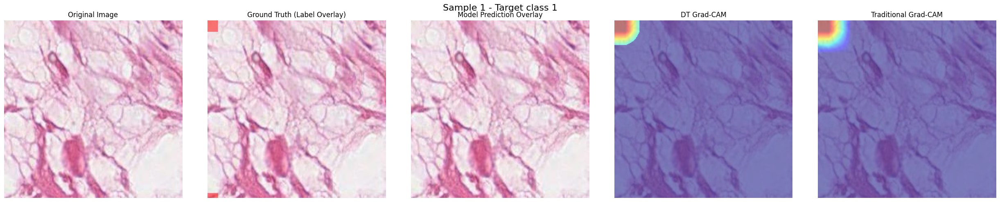

Otsu Threshold (uint8): 92
Target class for Grad-CAM: 1



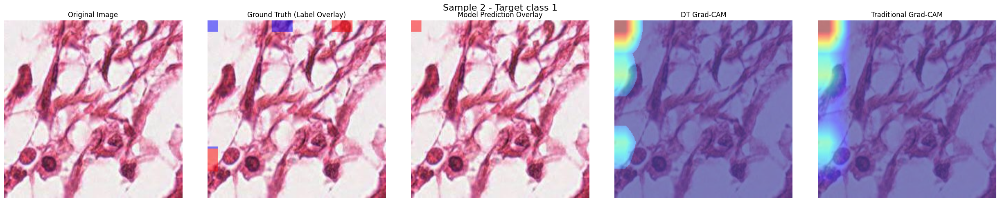

Otsu Threshold (uint8): 58
Target class for Grad-CAM: 1



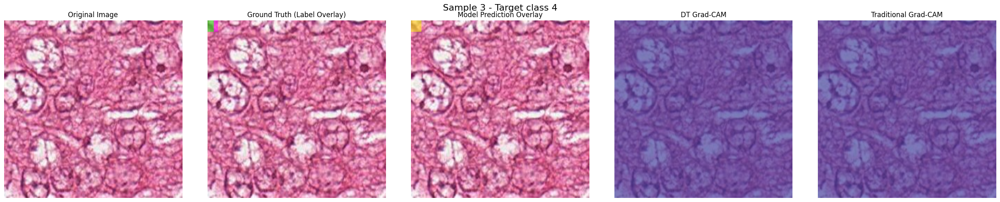

Otsu Threshold (uint8): 0.0
Target class for Grad-CAM: 4



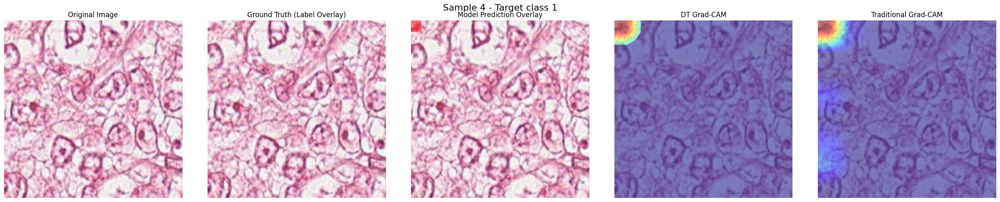

Otsu Threshold (uint8): 93
Target class for Grad-CAM: 1



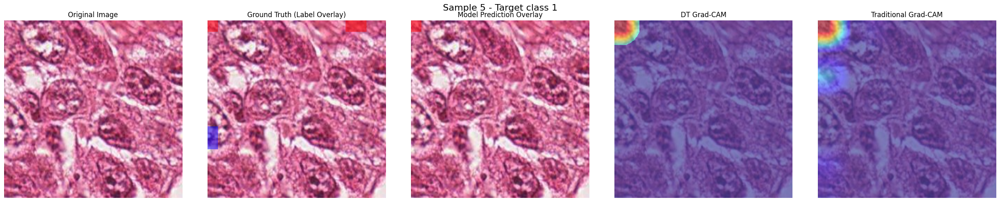

Otsu Threshold (uint8): 93
Target class for Grad-CAM: 1



In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget
import matplotlib.pyplot as plt
import numpy as np
import torch
import skimage.filters as filters

NUM_CLASSES = 6
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load your trained model
model = DALAResNet50Segmentation(n_classes=NUM_CLASSES).to(device)
model.load_state_dict(torch.load('best_dala_model.pth', map_location=device))
model.eval()

test_dataset = MitosisSegmentationDataset(
    root_dir='/content/ms-mitosis-detection2-1',
    split='test',
    max_images=5,
    transforms=get_val_transforms(),
    verbose=False
)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=5, shuffle=True)

cam = GradCAM(model=model, target_layers=[model.layer4[-1]])

img_batch, true_mask_batch = next(iter(test_loader))
img_batch = img_batch.to(device)

for i in range(min(5, img_batch.size(0))):
    img_tensor = img_batch[i].unsqueeze(0)  # [1, C, H, W]
    true_mask = true_mask_batch[i].cpu().numpy()  # [H, W]

    # Unnormalize image for display
    img_display = img_tensor[0].cpu().permute(1, 2, 0).numpy() * 0.5 + 0.5
    img_display = np.clip(img_display, 0, 1)

    with torch.no_grad():
        output = model(img_tensor)
        pred_softmax = output.softmax(dim=1)
        pred_mask = pred_softmax.argmax(1)[0].cpu().numpy()

    class_counts = np.bincount(pred_mask.flatten(), minlength=NUM_CLASSES)
    if np.sum(class_counts[1:]) > 0:
        target_category = np.argmax(class_counts[1:]) + 1
    else:
        target_category = 1

    mask_for_target = np.ones((img_tensor.shape[2], img_tensor.shape[3]), dtype=np.uint8)
    targets = [SemanticSegmentationTarget(target_category, mask_for_target)]

    grayscale_cam = cam(input_tensor=img_tensor, targets=targets)[0]  # [H, W]

    cam_norm = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)
    cam_uint8 = (cam_norm * 255).astype(np.uint8)
    if np.unique(cam_uint8).size > 1:
        otsu_thresh = filters.threshold_otsu(cam_uint8)
    else:
        otsu_thresh = np.mean(cam_uint8)
    dt_mask = (cam_uint8 > otsu_thresh).astype(np.float32)
    dt_gradcam = cam_norm * dt_mask

    # Plot
    fig, axs = plt.subplots(1, 5, figsize=(25, 5))
    fig.suptitle(f"Sample {i+1} - Target class {target_category}", fontsize=16)

    axs[0].imshow(img_display)
    axs[0].set_title("Original Image")
    axs[0].axis('off')

    axs[1].imshow(overlay_mask(img_display, true_mask, alpha=0.5))
    axs[1].set_title("Ground Truth (Label Overlay)")
    axs[1].axis('off')

    axs[2].imshow(overlay_mask(img_display, pred_mask, alpha=0.5))
    axs[2].set_title("Model Prediction Overlay")
    axs[2].axis('off')

    axs[3].imshow(img_display, alpha=0.7)
    axs[3].imshow(dt_gradcam, cmap='jet', alpha=0.5)
    axs[3].set_title("DT Grad-CAM")
    axs[3].axis('off')

    axs[4].imshow(img_display, alpha=0.7)
    axs[4].imshow(cam_norm, cmap='jet', alpha=0.5)
    axs[4].set_title("Traditional Grad-CAM")
    axs[4].axis('off')

    plt.tight_layout()
    plt.show()

    print(f"Otsu Threshold (uint8): {otsu_thresh}")
    print(f"Target class for Grad-CAM: {target_category}\n")


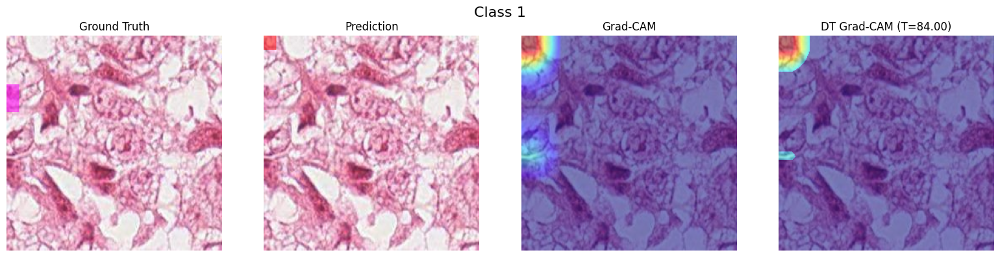

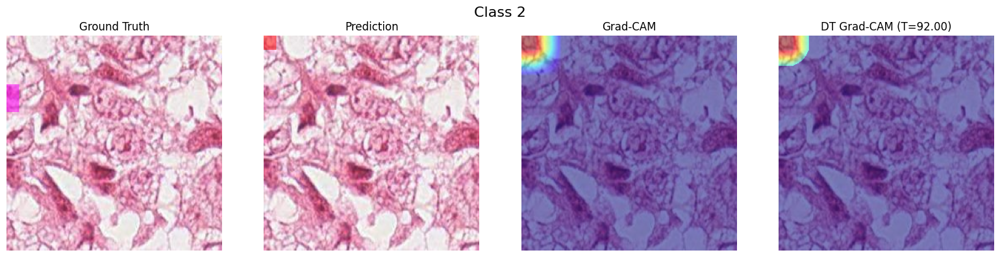

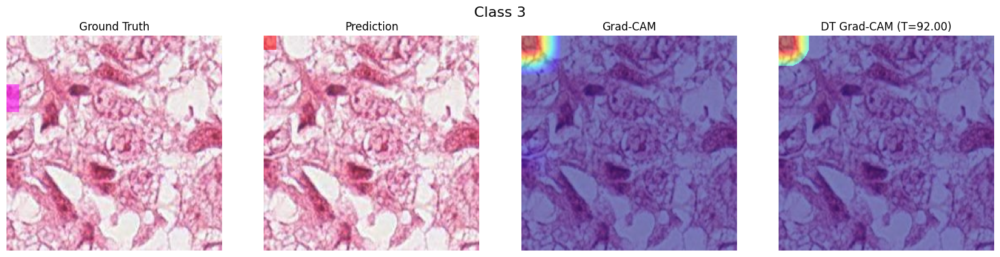

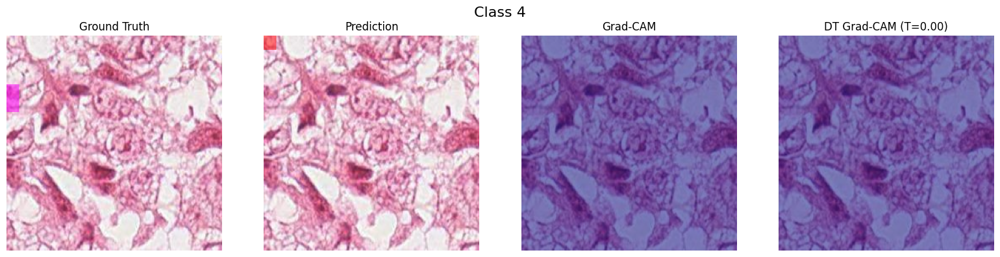

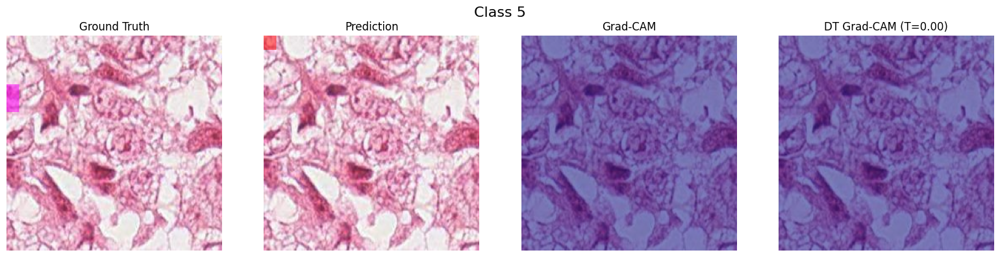

In [ ]:
import torch, numpy as np, matplotlib.pyplot as plt, skimage.filters as filters
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import SemanticSegmentationTarget

# Setup
NUM_CLASSES = 6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load model
model = DALAResNet50Segmentation(n_classes=NUM_CLASSES).to(device)
model.load_state_dict(torch.load('best_dala_model.pth', map_location=device))
model.eval()

# Load one random test sample
test_ds = MitosisSegmentationDataset(
    root_dir='/content/ms-mitosis-detection2-1', split='test',
    transforms=get_val_transforms(), verbose=False
)
test_loader = torch.utils.data.DataLoader(test_ds, batch_size=1, shuffle=True)

img_tensor, true_mask = next(iter(test_loader))  # (1,C,H,W), (1,H,W)
img_tensor = img_tensor.to(device)
true_mask = true_mask[0].cpu().numpy()

def unnorm(x):
    """Undo normalization for visualization"""
    return np.clip(x.permute(1,2,0).cpu().numpy() * 0.5 + 0.5, 0, 1)

img_disp = unnorm(img_tensor[0])

def overlay_mask(image, mask, alpha=0.5):
    """Blend segmentation mask with image using fixed colors"""
    colors = [[0,0,0],[1,0,0],[0,1,0],[0,0,1],[1,1,0],[1,0,1]]
    cmask = np.zeros((mask.shape + (3,)), dtype=np.float32)
    for cid, c in enumerate(colors[:NUM_CLASSES]):
        if cid == 0:  # skip background
            continue
        cmask[mask == cid] = c
    blend = image * (1 - (mask > 0)[..., None] * alpha) + cmask * alpha
    return np.clip(blend, 0, 1)

cam_engine = GradCAM(model=model, target_layers=[model.layer4[-1]])

# Predicted mask (for reference)
with torch.no_grad():
    output = model(img_tensor)
    pred_mask = output.argmax(1)[0].cpu().numpy()

# Grad-CAM per class
for cls in range(1, NUM_CLASSES):
    full_mask = np.ones((img_tensor.shape[2], img_tensor.shape[3]), dtype=np.uint8)
    targets = [SemanticSegmentationTarget(cls, full_mask)]

    grayscale_cam = cam_engine(img_tensor, targets=targets)[0]
    cam_norm = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)

    # Thresholded Grad-CAM (DT-Grad-CAM)
    cam_uint = (cam_norm * 255).astype(np.uint8)
    thresh = filters.threshold_otsu(cam_uint) if cam_uint.max() > cam_uint.min() else cam_uint.mean()
    dt_mask = (cam_uint > thresh).astype(np.float32)
    dt_cam = cam_norm * dt_mask

    # Visualization
    plt.figure(figsize=(16,4))
    plt.suptitle(f'Class {cls}', fontsize=16)

    plt.subplot(1,4,1); plt.imshow(overlay_mask(img_disp, true_mask, alpha=0.5))
    plt.title('Ground Truth'); plt.axis('off')

    plt.subplot(1,4,2); plt.imshow(overlay_mask(img_disp, pred_mask, alpha=0.5))
    plt.title('Prediction'); plt.axis('off')

    plt.subplot(1,4,3); plt.imshow(img_disp); plt.imshow(cam_norm, cmap='jet', alpha=0.5)
    plt.title('Grad-CAM'); plt.axis('off')

    plt.subplot(1,4,4); plt.imshow(img_disp); plt.imshow(dt_cam, cmap='jet', alpha=0.5)
    plt.title(f'DT Grad-CAM (T={thresh:.2f})'); plt.axis('off')

    plt.tight_layout(); plt.show()